# Portfolio Optimization - Markowitz Theory

## Efficient porfolio

### 1. Install specific library to get the stock price data

In [1]:
#pip install yfinance plotly

In [5]:
#pip install mpld3

### 2. Import libraries

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf
import plotly.express as px

ModuleNotFoundError: No module named 'yfinance'

## I - Load historical stock price data (dividend included)

In [106]:
ticker_list = ['RI.PA', 'SU.PA', 'OR.PA', 'AI.PA', 'MC.PA', 'CAP.PA', 'BN.PA', 'AC.PA', 'SW.PA', 'TTE.PA', '^FCHI', 'XWD.TO', '^GSPC', '^SP500TR', 'BTC-USD', 'LYYA.F', 'GC=F']
data_ticker = yf.download(ticker_list, start='2012-01-01', end='2024-05-31')['Close']
data_ticker.head(10)

[*********************100%***********************]  17 of 17 completed


,AC.PA,AI.PA,BN.PA,BTC-USD,CAP.PA,GC=F,LYYA.F,MC.PA,OR.PA,RI.PA,SU.PA,SW.PA,TTE.PA,XWD.TO,^FCHI,^GSPC,^SP500TR
Date,,,,,,,,,,,,,,,,,
2012-01-02,19.940001,58.607555,49.244999,NaN,25.075001,NaN,93.059998,111.349998,81.800003,72.470001,41.560001,40.210781,40.000000,NaN,NaN,NaN,NaN
2012-01-03,20.059999,58.812710,49.790001,NaN,25.250000,1599.699951,92.599998,112.150002,82.120003,72.059998,43.259998,40.487244,40.445000,22.474951,3245.399902,1277.060059,2192.399902
2012-01-04,19.670000,58.438606,48.584999,NaN,25.090000,1611.900024,92.650002,110.900002,81.330002,71.620003,42.080002,40.647301,40.134991,22.484970,3193.649902,1277.300049,2193.280029
2012-01-05,18.959999,57.412838,48.430000,NaN,24.245001,1619.400024,93.000000,109.949997,81.419998,71.529999,42.505001,40.188953,39.860001,22.474951,3144.909912,1281.060059,2199.729980
2012-01-06,19.105000,57.261990,48.264999,NaN,24.684999,1616.099976,NaN,108.900002,81.180000,71.930000,42.424999,40.530895,39.990002,22.515030,3137.360107,1277.810059,2194.979980
2012-01-09,18.795000,57.189583,48.980000,NaN,24.799999,1607.500000,93.230003,110.050003,81.620003,73.349998,42.695000,40.763706,39.959999,22.505011,3127.689941,1280.699951,2200.000000
2012-01-10,19.754999,59.108372,48.889999,NaN,25.295000,1631.000000,94.269997,115.199997,82.949997,74.330002,44.560001,40.894661,40.439999,22.605209,3210.790039,1292.079956,2219.580078
2012-01-11,19.650000,58.969593,48.384991,NaN,24.980000,1639.199951,94.419998,113.599998,81.680000,73.870003,45.020000,41.469414,39.875000,22.605209,3204.830078,1292.479980,2220.479980
2012-01-12,20.400000,58.734268,47.560001,NaN,24.650000,1647.300049,93.870003,114.300003,80.959999,73.970001,44.950001,40.676403,39.049999,22.725451,3199.979980,1295.500000,2225.739990


In [107]:
stocks = ['RI.PA', 'SU.PA', 'OR.PA', 'AI.PA', 'MC.PA', 'CAP.PA', 'SW.PA', 'TTE.PA', 'GC=F', '^GSPC']
data = data_ticker[stocks]
data.tail(10)

,RI.PA,SU.PA,OR.PA,AI.PA,MC.PA,CAP.PA,SW.PA,TTE.PA,GC=F,^GSPC
Date,,,,,,,,,,
2024-05-21,144.850006,231.250000,447.549988,184.660004,768.099976,209.600006,85.300003,66.400002,2421.699951,5321.410156
2024-05-22,144.199997,233.050003,453.399994,182.800003,751.900024,207.600006,86.099998,65.169998,2389.199951,5307.009766
2024-05-23,142.199997,235.750000,450.950012,181.720001,752.799988,213.300003,86.099998,65.699997,2335.000000,5267.839844
2024-05-24,141.000000,238.199997,447.350006,182.240005,750.000000,213.000000,85.349998,65.989998,2332.500000,5304.720215
2024-05-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-27,141.300003,237.649994,449.350006,183.679993,756.200012,213.899994,86.050003,66.400002,NaN,NaN
2024-05-28,139.300003,232.699997,445.649994,181.539993,745.400024,210.100006,85.550003,66.139999,2355.199951,5306.040039
2024-05-29,135.850006,227.350006,440.299988,179.160004,724.200012,203.199997,85.250000,65.629997,2340.300049,5266.950195


In [108]:
# Forward fill missing data for all tickers to handle NaN values due to non-trading days
data_filled = data.fillna(method='ffill')

In [109]:
returns_ticker = data_filled.pct_change().fillna(0)
#returns_ticker[abs(returns_ticker['Close']['OR.PA']- returns_ticker['Adj Close']['OR.PA']) > 0.000001]
returns_ticker

,RI.PA,SU.PA,OR.PA,AI.PA,MC.PA,CAP.PA,SW.PA,TTE.PA,GC=F,^GSPC
Date,,,,,,,,,,
2012-01-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2012-01-03,-0.005658,0.040905,0.003912,0.003500,0.007185,0.006979,0.006875,0.011125,0.000000,0.000000
2012-01-04,-0.006106,-0.027277,-0.009620,-0.006361,-0.011146,-0.006337,0.003953,-0.007665,0.007626,0.000188
2012-01-05,-0.001257,0.010100,0.001107,-0.017553,-0.008566,-0.033679,-0.011276,-0.006852,0.004653,0.002944
2012-01-06,0.005592,-0.001882,-0.002948,-0.002627,-0.009550,0.018148,0.008508,0.003261,-0.002038,-0.002537
...,...,...,...,...,...,...,...,...,...,...
2024-05-26,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2024-05-27,0.002128,-0.002309,0.004471,0.007902,0.008267,0.004225,0.008202,0.006213,0.000000,0.000000
2024-05-28,-0.014154,-0.020829,-0.008234,-0.011651,-0.014282,-0.017765,-0.005811,-0.003916,0.009732,0.000249


In [110]:
# Step 4: Calculate expected returns and the covariance matrix
mean_returns_ticker = returns_ticker.mean()
cov_matrix_ticker = returns_ticker.cov()

In [111]:
mean_returns = mean_returns_ticker[stocks]
cov_matrix = cov_matrix_ticker[stocks][:len(stocks)]
cov_matrix

,RI.PA,SU.PA,OR.PA,AI.PA,MC.PA,CAP.PA,SW.PA,TTE.PA,GC=F,^GSPC
RI.PA,1.217642e-04,7.430176e-05,0.000079,5.880787e-05,0.000090,7.216726e-05,0.000063,5.476098e-05,-7.643704e-07,0.000030
SU.PA,7.430176e-05,2.187294e-04,0.000096,1.042799e-04,0.000134,1.292733e-04,0.000083,1.084406e-04,-3.468724e-07,0.000064
OR.PA,7.919776e-05,9.639547e-05,0.000140,7.675887e-05,0.000112,8.377871e-05,0.000058,6.712903e-05,-1.737599e-06,0.000041
AI.PA,5.880787e-05,1.042799e-04,0.000077,1.205833e-04,0.000096,8.546487e-05,0.000056,7.842194e-05,1.965947e-07,0.000043
MC.PA,9.041867e-05,1.341575e-04,0.000112,9.605299e-05,0.000209,1.155054e-04,0.000082,9.738936e-05,-5.457640e-06,0.000060
CAP.PA,7.216726e-05,1.292733e-04,0.000084,8.546487e-05,0.000116,2.373352e-04,0.000087,8.916732e-05,-7.495912e-07,0.000057
SW.PA,6.275842e-05,8.251056e-05,0.000058,5.623695e-05,0.000082,8.684363e-05,0.000201,8.754263e-05,-8.387751e-06,0.000038
TTE.PA,5.476098e-05,1.084406e-04,0.000067,7.842194e-05,0.000097,8.916732e-05,0.000088,2.057644e-04,8.380728e-07,0.000053
GC=F,-7.643704e-07,-3.468724e-07,-0.000002,1.965947e-07,-0.000005,-7.495912e-07,-0.000008,8.380728e-07,6.969282e-05,0.000003
^GSPC,2.951848e-05,6.382342e-05,0.000041,4.339483e-05,0.000060,5.695831e-05,0.000038,5.277442e-05,2.809563e-06,0.000082


In [112]:
# Number of portfolios to simulate
num_portfolios = 10000
results = np.zeros((3+len(stocks), num_portfolios))
weights_record = []

for i in range(num_portfolios):
    # Select random weights for portfolio holdings
    weights = np.random.random(len(stocks))
    weights /= np.sum(weights)
    weights_record.append(weights)
    
    # Calculate expected portfolio return and volatility
    portfolio_return = np.sum(weights * mean_returns) * 252
    portfolio_stddev = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    
    # Store results in results array
    results[0,i] = portfolio_return
    results[1,i] = portfolio_stddev
    
    # Store Sharpe Ratio (return-no_risk_return / volatility)
    results[2,i] = (results[0,i]-0.03) / results[1,i]


### Record the weights

In [113]:
for j in range(len(weights_record)):
    for k in range(len(stocks)):
        results[k+3,j] = weights_record[j][k]

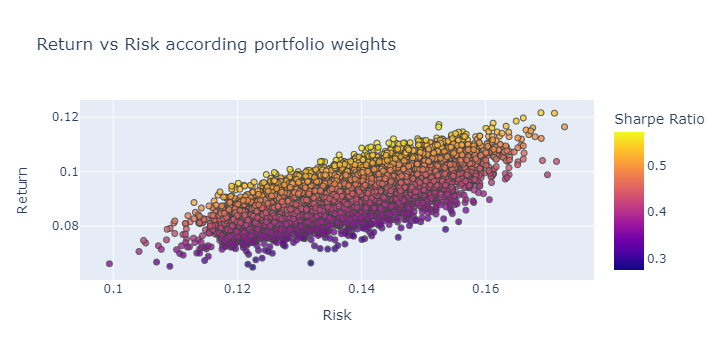

In [114]:
import pandas as pd
import plotly.express as px

# Convert results array to Pandas DataFrame
data_dict = {
    'Return': results[0, :],
    'Risk': results[1, :],
    'Sharpe Ratio': results[2, :]
}
for i, stock in enumerate(stocks):
    data_dict[f'Weight in {stock}'] = [rec[i] for rec in weights_record]

results_frame = pd.DataFrame(data_dict)

# Create the interactive plot
fig = px.scatter(results_frame, x='Risk', y='Return', color='Sharpe Ratio',
                 hover_data=[f'Weight in {stock}' for stock in stocks],
                 title='Return vs Risk according portfolio weights',
                 labels={'color': 'Sharpe Ratio'})
fig.update_traces(marker=dict(size=6, opacity=0.8, line=dict(width=1)), selector=dict(mode='markers'))
fig.show()


## Efficient frontier

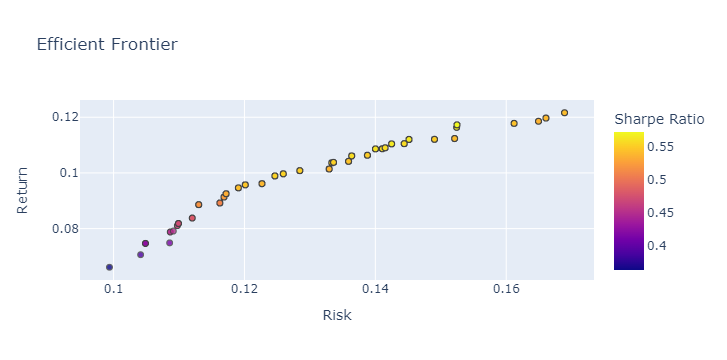

In [115]:
# Assuming you have a variable named 'results_frame' containing your data
risks = np.unique(results_frame['Risk'])


# Extract portfolios on the Efficient Frontier
eff_frontier = results_frame.iloc[[results_frame.Return[results_frame.Risk <= r].idxmax() for r in np.unique(risks)]]

# Create the interactive plot for Efficient Frontier
fig_eff = px.scatter(eff_frontier, x='Risk', y='Return', color='Sharpe Ratio',
                     hover_data=[f'Weight in {stock}' for stock in stocks],
                     title='Efficient Frontier',
                     labels={'color': 'Sharpe Ratio'})
fig_eff.update_traces(marker=dict(size=6, opacity=0.8, line=dict(width=1)), selector=dict(mode='markers'))

# Show plots
fig_eff.show()

### Portfolio cumulative return

In [124]:
# Select a portfolio based on user-chosen weights
chosen_weights = [0.066, 0.082, 0.137, 0.011, 0.07, 0.31, 0.011, 0.018, 0.092, 0.203]  # Replace with your chosen weights

# Convert the returns and chosen_weights into DataFrames
returns_df = pd.DataFrame(returns_ticker)
chosen_weights_df = pd.DataFrame([chosen_weights], columns=stocks)

# Replace NaN values with zero in the returns DataFrame
returns_cleaned = returns_df.fillna(0)

# Calculate the portfolio returns for the chosen period
chosen_portfolio_returns = np.dot(returns_cleaned, np.transpose(chosen_weights_df))

# Calculate cumulative returns for the chosen portfolio
chosen_portfolio_cumulative_returns = (chosen_portfolio_returns + 1).cumprod() - 1

chosen_portfolio_percentage_returns = chosen_portfolio_cumulative_returns*100  # Convert to percentage

## Graphic of the porfolio performance above time

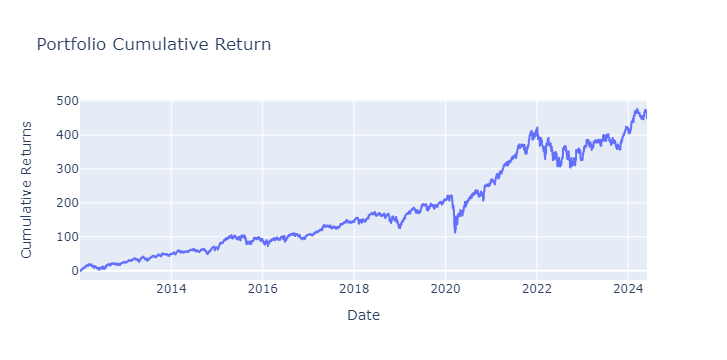

In [125]:
# Create a Plotly figure for portfolio performance over time
fig_portfolio = px.line(x=returns_ticker.index, y=chosen_portfolio_percentage_returns,
                        labels={'x': 'Date', 'y': 'Cumulative Returns'},
                        title='Portfolio Cumulative Return')

# Display the interactive portfolio performance figure
fig_portfolio.show()

In [126]:
# Create a DataFrame for the portfolio performance
portfolio_df = pd.DataFrame(chosen_portfolio_percentage_returns, columns=['Portfolio'])

# Convert arrays to Series
portfolio_series = pd.Series(portfolio_df['Portfolio'])

In [127]:
data_ticker[['XWD.TO', '^FCHI', '^GSPC', '^SP500TR', 'LYYA.F', 'GC=F']]

,XWD.TO,^FCHI,^GSPC,^SP500TR,LYYA.F,GC=F
Date,,,,,,
2012-01-02,NaN,NaN,NaN,NaN,93.059998,NaN
2012-01-03,22.474951,3245.399902,1277.060059,2192.399902,92.599998,1599.699951
2012-01-04,22.484970,3193.649902,1277.300049,2193.280029,92.650002,1611.900024
2012-01-05,22.474951,3144.909912,1281.060059,2199.729980,93.000000,1619.400024
2012-01-06,22.515030,3137.360107,1277.810059,2194.979980,NaN,1616.099976
...,...,...,...,...,...,...
2024-05-26,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-27,86.489998,8132.490234,NaN,NaN,319.589996,NaN
2024-05-28,86.110001,8057.799805,5306.040039,11554.450195,318.309998,2355.199951


In [128]:
#Cumulative return of indexes
returns_index = data_ticker[['XWD.TO', '^FCHI', '^GSPC', '^SP500TR', 'LYYA.F', 'GC=F']].pct_change().fillna(0)
# Replace NaN values with zero in the returns DataFrame
#returns_index_cleaned = returns_ticker[['XWD.TO', '^FCHI', '^GSPC', '^SP500TR', 'LYYA.F', 'GC=F']].fillna(0)

In [129]:
# Calculate cumulative returns for the chosen portfolio
index_cumulative_returns = (returns_index[['XWD.TO', '^FCHI', '^GSPC', '^SP500TR', 'LYYA.F', 'GC=F']] + 1).cumprod() - 1

index_series = index_cumulative_returns*100 

In [130]:
# Reset the indices of both series
#portfolio_series = portfolio_series.reset_index(drop=True)
#index_series = index_series.reset_index(drop=True)

portfolio_series.index = index_series.index

# Concatenate the series into a DataFrame
combined_series = pd.concat([portfolio_series, index_series], axis=1)

# Rename the columns
combined_series.columns = ['Portfolio', 'XWD.TO', '^FCHI', '^GSPC', '^SP500TR', 'LYYA.F', 'GC=F']

# Print or do further operations with combined_df
print(combined_series)


             Portfolio      XWD.TO       ^FCHI       ^GSPC    ^SP500TR  \
Date                                                                     
2012-01-02    0.000000    0.000000    0.000000    0.000000    0.000000   
2012-01-03    0.649753    0.000000    0.000000    0.000000    0.000000   
2012-01-04    0.033084    0.044580   -1.594565    0.018792    0.040144   
2012-01-05   -0.923034    0.000000   -3.096382    0.313219    0.334340   
2012-01-06   -0.507978    0.178328   -3.329013    0.058729    0.117683   
...                ...         ...         ...         ...         ...   
2024-05-26  470.764794  283.716070  149.429052  315.385336  426.891082   
2024-05-27  472.329303  284.828419  150.585151  315.385336  426.891082   
2024-05-28  466.838433  283.137660  148.283726  315.488685  427.022930   
2024-05-29  455.651643  281.624847  144.500833  312.427760  423.146345   
2024-05-30  449.378055  280.112068  145.840575  309.963490  420.073897   

                LYYA.F       GC=F  
D

## Graphic of the portfolio and indexes above time 

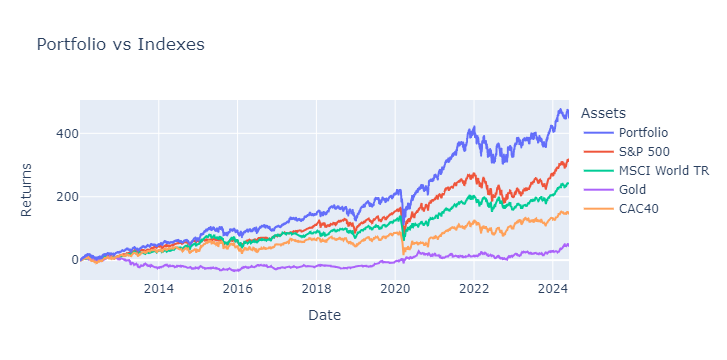

In [131]:
import plotly.graph_objects as go

# Create a line plot
fig = px.line(combined_series['Portfolio'], title='Portfolio vs Indexes')

# Add traces for both Portfolio and XWD.TO
#fig.add_trace(go.Scatter(x=combined_series.index, y=combined_series['XWD.TO'], mode='lines', name='MSCI World'))
fig.add_trace(go.Scatter(x=combined_series.index, y=combined_series['^GSPC'], mode='lines', name='S&P 500'))
fig.add_trace(go.Scatter(x=combined_series.index, y=combined_series['LYYA.F'], mode='lines', name='MSCI World TR'))
fig.add_trace(go.Scatter(x=combined_series.index, y=combined_series['GC=F'], mode='lines', name='Gold'))
fig.add_trace(go.Scatter(x=combined_series.index, y=combined_series['^FCHI'], mode='lines', name='CAC40'))


#fig.add_trace(go.Scatter(x=combined_series.index, y=combined_series['BTC-USD'], mode='lines', name='Bitcoin'))
#fig.add_trace(go.Scatter(x=combined_series.index, y=combined_series['Portfolio'], mode='lines', name='Portfolio'))

# Update layout if needed
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Returns',
    legend_title='Assets'
)

# Show the plot
fig.show()